c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\utils\_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\albumentations\__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.6 (you have 1.4.16). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


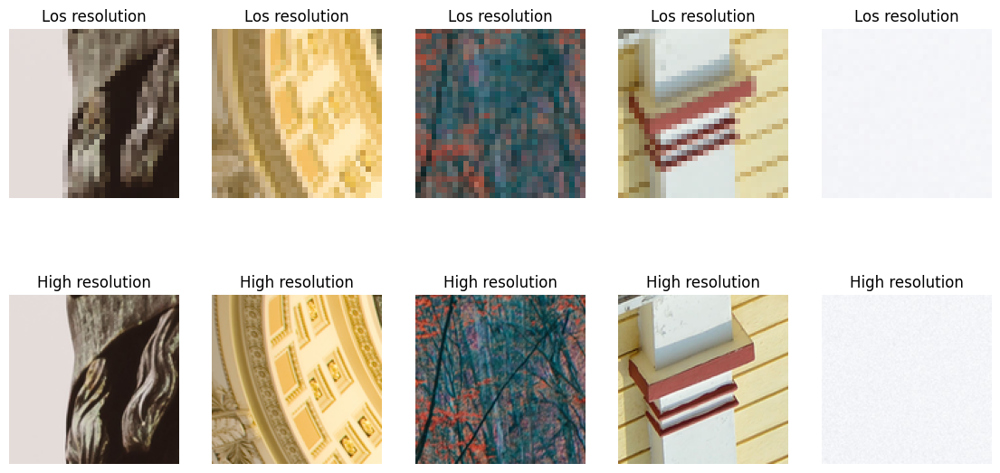

torch.Size([5, 3, 96, 96])
torch.Size([5, 1])


In [1]:
from PIL import Image

import numpy as np
from tqdm import tqdm

import cv2
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vgg19
import os

import albumentations as A
from albumentations.pytorch import ToTensorV2
device="cuda" if torch.cuda.is_available() else "cpu"
device
class CreateDataset(Dataset):
    def __init__(self, root_dir, lowres_transform, highres_transform, both_transform):
        super(CreateDataset, self).__init__()
        self.root_dir = root_dir
        
        self.lowres_transform = lowres_transform
        self.highres_transform = highres_transform
        self.both_transform = both_transform
        self.list_of_files = os.listdir(os.path.join(root_dir))
        
    def __len__(self):
        return len(self.list_of_files)
    
    def __getitem__(self, index):
        image = cv2.imread(os.path.join(self.root_dir, self.list_of_files[index]))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        image = self.both_transform(image = image)['image']
        
        
        low_res_image = self.lowres_transform(image=image)['image']
        high_res_image = self.highres_transform(image=image)['image']
        
        return low_res_image, high_res_image
highRes = 128
lowRes = highRes//4
num_channels = 3
highresTransform = A.Compose(
    [
        A.Resize(width = highRes, height = highRes),
        A.Normalize(mean = [0,0,0], std = [1,1,1]),
        ToTensorV2(),
    ]
)

lowresTransform = A.Compose(
    [
        A.Resize(width = lowRes, height = lowRes, interpolation = Image.BICUBIC),
        A.Normalize(mean = [0,0,0], std = [1,1,1]),
        ToTensorV2(),
    ]
)

bothTransform = A.Compose(
    [
        A.RandomCrop(width = highRes, height = highRes),
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
    ]
)
# trainDataset = CreateDataset(
#     root_dir = r'/kaggle/input/div2k/DIV2K_train_HR/DIV2K_train_HR',
#     lowres_transform = lowresTransform,
#     highres_transform = highresTransform,
#     both_transform = bothTransform
# )

# valDataset = CreateDataset(
#     root_dir = r'/kaggle/input/div2k/DIV2K_valid_HR/DIV2K_valid_HR',
#     lowres_transform = lowresTransform,
#     highres_transform = highresTransform,
#     both_transform = bothTransform
# )
trainDataset = CreateDataset(
    root_dir = r'archive (3)\DIV2K_train_HR\DIV2K_train_HR',
    lowres_transform = lowresTransform,
    highres_transform = highresTransform,
    both_transform = bothTransform
)

valDataset = CreateDataset(
    root_dir = r'archive (3)\DIV2K_valid_HR\DIV2K_valid_HR',
    lowres_transform = lowresTransform,
    highres_transform = highresTransform,
    both_transform = bothTransform
)
torch.backends.cuda.matmul.allow_tf32 = False
torch.backends.cudnn.benchmark = True
num_workers = 0
batch_size = 64
# batch_size=8
trainDataLoader = DataLoader(
    trainDataset,
    batch_size=batch_size,
    shuffle=True,
    pin_memory=True,
    num_workers=num_workers
)

valDataLoader = DataLoader(
    valDataset,
    batch_size=1,
    shuffle=True,
    pin_memory=True,
    num_workers=num_workers
)
fig, axes = plt.subplots(2,5, figsize = (14, 7))

for i, (low_res, high_res) in enumerate(valDataLoader):
    if i >= 5:
        plt.show()
        break
    
    axes[0, i].imshow(low_res[0].permute(1,2,0))
    axes[0, i].set_title("Los resolution")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(high_res[0].permute(1,2,0))
    axes[1, i].set_title("High resolution")
    axes[1, i].axis('off')
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act, kernel_size = 3, stride = 1, padding = 1):
        super().__init__()
        self.cnn = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size = kernel_size,
            stride = stride,
            padding = padding
        )
        self.act = nn.LeakyReLU(0.2, inplace=True) if use_act else nn.Identity()
        
    def forward(self, x):
        return self.act(self.cnn(x))
class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, scale_factor = 2):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=scale_factor, mode="nearest")
        self.conv = nn.Conv2d(in_channels, in_channels, 3, 1, 1, bias=True)
        self.act = nn.LeakyReLU(0.2, inplace=True)
        
    def forward(self, x):
        return self.act(self.conv(self.upsample(x)))
import torch.nn as nn
class DenseResidualBlock(nn.Module):
    def __init__(self, in_channels, channels = 32, residual_beta = 0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.blocks = nn.ModuleList()
        
        for i in range(5):
            self.blocks.append(
                ConvBlock(
                    in_channels + channels*i,
                    channels if i <= 3 else in_channels,
                    kernel_size=3,
                    stride=1,
                    padding=1,
                    use_act=True if i <=3 else False,
                )
            )
        
    def forward(self, x):
        new_inputs = x
        for block in self.blocks:
            out = block(new_inputs)
            new_inputs = torch.cat([new_inputs, out], dim=1)
        
        return self.residual_beta * out + x
class RRDB(nn.Module):
    def __init__(self, in_channels, residual_beta = 0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.rrdb = nn.Sequential(*[DenseResidualBlock(in_channels) for _ in range(3)])
    
    def forward(self, x):
        return self.rrdb(x) * self.residual_beta + x
class Generator(nn.Module):
    def __init__(self, in_channels = 3, num_channels = 64, num_blocks = 5):
        super().__init__()
        self.initial = nn.Conv2d(
            in_channels = in_channels,
            out_channels = num_channels,
            kernel_size = 3,
            stride = 1,
            padding = 1,
            bias = True
        )
        self.residuals = nn.Sequential(*[RRDB(num_channels) for _ in range(num_blocks)])
        self.conv = nn.Conv2d(num_channels, num_channels, kernel_size = 3, stride = 1, padding = 1)
        self.upsamples = nn.Sequential(
            UpsampleBlock(num_channels),
            UpsampleBlock(num_channels)
        )
        self.final = nn.Sequential(
            nn.Conv2d(num_channels, num_channels, kernel_size = 3, stride = 1, padding = 1, bias = True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(num_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)
        )
        
    def forward(self, x):
        initial = self.initial(x)
        out = self.residuals(initial)
        out = self.conv(out) + initial
        out = self.upsamples(out)
        out = self.final(out)
        return out
class Discriminator(nn.Module):
    def __init__(self, in_channels = 3, features = (64, 64, 128, 256, 256, 512, 512)):
        super().__init__()
        self.in_channels = in_channels
        self.features = list(features)
        
        self.blocks = nn.Sequential(
            ConvBlock(in_channels, 64, kernel_size=3, stride=1, padding=1, use_act=True),
            ConvBlock(64, 64, kernel_size=3, stride=2, padding=1, use_act=True),
            ConvBlock(64, 128, kernel_size=3, stride=1, padding=1, use_act=True),
            ConvBlock(128, 256, kernel_size=3, stride=2, padding=1, use_act=True),
            ConvBlock(256, 256, kernel_size=3, stride=1, padding=1, use_act=True),
            ConvBlock(256, 512, kernel_size=3, stride=2, padding=1, use_act=True),
            ConvBlock(512, 512, kernel_size=3, stride=1, padding=1, use_act=True)
        )
        
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((6, 6)),
            nn.Flatten(),
            nn.Linear(in_features=512*6*6, out_features=1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(in_features=1024, out_features=1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        features = self.blocks(x)
        out = self.classifier(features)
        return out

def init_weight(model, scale = 0.1):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale
            
        elif isinstance(m, nn.Linear):
            nn.init.Kaiming_normal_(m.weight.data)
            m.weight.data *= scale
def test_size():
    gen = Generator()
    disc = Discriminator()
    low_res = 24
    x = torch.randn((5, 3, low_res, low_res))
    gen_out = gen(x)
    disc_out = disc(x)
    
    print(gen_out.shape)
    print(disc_out.shape)
test_size()
class VGGLoss(nn.Module):
    def __init__(self, device):
        super().__init__()
        
        self.vgg = vgg19(pretrained = True).features[:35].eval().to(device)
        self.loss = nn.MSELoss()
        
        for param in self.vgg.parameters():
            param.requires_grad = False
            
    def forward(self, output, target):
        vgg_input_features = self.vgg(output)
        vgg_target_features = self.vgg(target)
        loss = self.loss(vgg_input_features, vgg_target_features)
        
        return loss
class ESRGANLoss(nn.Module):
    def __init__(self, l1_weight = 1e-2, vgg_weight = 1, device = 'cpu'):
        super().__init__()
        
        self.vgg_criterion = VGGLoss(device)
        self.l1_criterion = nn.L1Loss().to(device)
        self.l1_weight = l1_weight
        
    def forward(self, output, target):
        vgg_loss = self.vgg_criterion(output, target)
        l1_loss = self.l1_criterion(output, target)
        
        loss = vgg_loss + self.l1_weight * l1_loss
        return loss

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from tqdm import tqdm
import matplotlib.pyplot as plt

# Assuming Generator and Discriminator classes are defined elsewhere
# from models import Generator, Discriminator  # Adjust the import path as needed

device = "cuda" if torch.cuda.is_available() else "cpu"

# Hyperparameters
batch_size = 16  # Adjust based on GPU memory
lr = 2e-4  # Lower learning rate for stability
num_epochs = 300
lambda_gp = 10
num_channels = 3

# Data loaders (assuming you have trainDataLoader and valDataLoader defined)
transform = transforms.Compose([
    transforms.Resize((96, 96)),  # Adjust size based on your dataset
    transforms.ToTensor(),
])


In [8]:

# train_dataset = datasets.ImageFolder(root=r'archive (3)\DIV2K_train_HR\DIV2K_train_HR', transform=transform)
# val_dataset = datasets.ImageFolder(root=r'archive (3)\DIV2K_valid_HR\DIV2K_valid_HR', transform=transform)

# trainDataLoader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
# valDataLoader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

trainDataset = CreateDataset(
    root_dir = r'archive (3)\DIV2K_train_HR\DIV2K_train_HR',
    lowres_transform = lowresTransform,
    highres_transform = highresTransform,
    both_transform = bothTransform
)

valDataset = CreateDataset(
    root_dir = r'archive (3)\DIV2K_valid_HR\DIV2K_valid_HR',
    lowres_transform = lowresTransform,
    highres_transform = highresTransform,
    both_transform = bothTransform
)
# Initialize models
netG = Generator(in_channels=num_channels, num_blocks=5).to(device)
netD = Discriminator(in_channels=num_channels).to(device)


In [9]:

# Weight initialization
def init_weight(model, scale=0.1):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale
        elif isinstance(m, nn.Linear):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale

init_weight(netG)
init_weight(netD)


In [10]:
model = {
    'discriminator': netD,
    'generator': netG
}

In [11]:

# Optimizers
optimizerNetG = optim.Adam(model['generator'].parameters(), lr=lr, betas=(0.9, 0.999))
optimizerNetD = optim.Adam(model['discriminator'].parameters(), lr=lr, betas=(0.9, 0.999))

# Loss functions
criterion_generator = ESRGANLoss(l1_weight=1e-2, device=device)
criterion_discriminator = nn.BCEWithLogitsLoss().to(device)

# Gradient scaler for mixed precision training
generator_scaler = torch.cuda.amp.GradScaler()
discriminator_scaler = torch.cuda.amp.GradScaler()

c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_57164\849822434.py:10: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  generator_scaler = torch.cuda.amp.GradScaler()
C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_57164\

In [12]:


def gradient_penalty(critic, real, fake, device):
    batch_size, channels, height, width = real.shape
    alpha = torch.rand((batch_size, 1, 1, 1)).repeat(1, channels, height, width).to(device)
    interpolated_images = real * alpha + fake.detach() * (1 - alpha)
    interpolated_images.requires_grad_(True)
    mixed_scores = critic(interpolated_images)
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


In [13]:

def train(loader, disc, gen, opt_gen, opt_disc, l1_loss_fn, vgg_loss_fn, g_scaler, d_scaler, device=device):
    loss_history = []
    for epoch in range(num_epochs):
        loop = tqdm(loader, leave=True)
        for idx, (low_res, high_res) in enumerate(loop):
            high_res = high_res.to(device)
            low_res = low_res.to(device)

            # Train Discriminator
            with torch.cuda.amp.autocast():
                fake = gen(low_res)
                critic_real = disc(high_res).reshape(-1)
                critic_fake = disc(fake.detach()).reshape(-1)
                gp = gradient_penalty(disc, high_res, fake, device=device)
                loss_critic = (
                    -(torch.mean(critic_real) - torch.mean(critic_fake))
                    + lambda_gp * gp
                )

            opt_disc.zero_grad()
            d_scaler.scale(loss_critic).backward()
            d_scaler.step(opt_disc)
            d_scaler.update()

            # Train Generator
            with torch.cuda.amp.autocast():
                l1_loss = l1_loss_fn(fake, high_res)
                adversarial_loss = -torch.mean(disc(fake)).reshape(-1)
                loss_for_vgg = vgg_loss_fn(fake, high_res)
                gen_loss = l1_loss + 5e-3 * adversarial_loss + loss_for_vgg

            opt_gen.zero_grad()
            g_scaler.scale(gen_loss).backward()
            g_scaler.step(opt_gen)
            g_scaler.update()

            loop.set_postfix(
                epoch=epoch,
                gp=gp.item(),
                critic=loss_critic.item(),
                l1=l1_loss.item(),
                vgg=loss_for_vgg.item(),
                adversarial=adversarial_loss.item()
            )

            loss_history.append({
                'epoch': epoch,
                'gp': gp.item(),
                'critic': loss_critic.item(),
                'l1': l1_loss.item(),
                'vgg': loss_for_vgg.item(),
                'adversarial': adversarial_loss.item()
            })
    return loss_history


In [14]:

# Training
loss_history = train(
    loader=trainDataLoader,
    disc=netD,
    gen=netG,
    opt_gen=optimizerNetG,
    opt_disc=optimizerNetD,
    l1_loss_fn=nn.L1Loss(),
    vgg_loss_fn=VGGLoss(device),
    g_scaler=generator_scaler,
    d_scaler=discriminator_scaler,
    device=device
)


  0%|          | 0/13 [00:00<?, ?it/s]C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_57164\3414633768.py:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\autograd\graph.py:823: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\cuda\CublasHandlePool.cpp:180.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_57164\3414633768.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
100%|██████████| 13/13 [01:12<00:00,  5.56s/it, ad

In [15]:

# Save the generator model
torch.save(netG.state_dict(), "super_res_gen300.pth")
torch.save(model['generator'].state_dict(), "super_res_gen_300.pth")
torch.save(model['generator'], "super_res_gen_full300.pth")


In [18]:

from torch.nn import functional as F
def calculate_psnr(generator, test_loader, device='cuda'):
    generator.eval()
    psnr_list = []
    with torch.no_grad():
        for low_res_images, high_res_images in tqdm(test_loader):
            low_res_images = low_res_images.to(device)
            high_res_images = high_res_images.to(device)
            generated_images = generator(low_res_images)
            generated_images = torch.clamp(generated_images, 0.0, 1.0)
            high_res_images = torch.clamp(high_res_images, 0.0, 1.0)
            mse = F.mse_loss(generated_images, high_res_images, reduction='mean')
            psnr = 10 * torch.log10(1.0 / mse)
            psnr_list.append(psnr.item())
    avg_psnr = np.mean(psnr_list)
    print(f"Average PSNR: {avg_psnr} dB")
    return avg_psnr


In [19]:

# Calculate PSNR on validation set
calculate_psnr(netG, valDataLoader)

100%|██████████| 100/100 [00:10<00:00,  9.56it/s]

Average PSNR: 26.08222967147827 dB


26.08222967147827

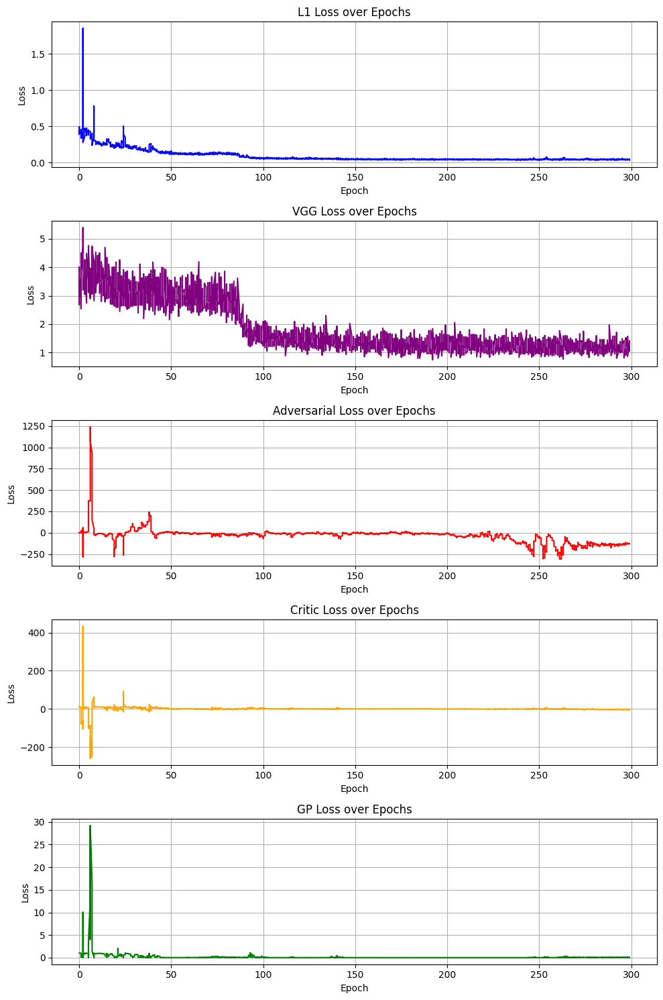

In [20]:


# Plotting the loss history
epochs = [loss['epoch'] for loss in loss_history]
gp_losses = [loss['gp'] for loss in loss_history]
critic_losses = [loss['critic'] for loss in loss_history]
l1_losses = [loss['l1'] for loss in loss_history]
adversarial_losses = [loss['adversarial'] for loss in loss_history]
vgg_losses = [loss['vgg'] for loss in loss_history]

fig, axs = plt.subplots(5, 1, figsize=(10, 15))
axs[0].plot(epochs, l1_losses, label='L1 Loss', color='blue')
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss")
axs[0].set_title("L1 Loss over Epochs")
axs[0].grid(True)

axs[1].plot(epochs, vgg_losses, label='VGG Loss', color='purple')
axs[1].set_xlabel("Epoch")
axs[1].set_ylabel("Loss")
axs[1].set_title("VGG Loss over Epochs")
axs[1].grid(True)

axs[2].plot(epochs, adversarial_losses, label='Adversarial Loss', color='red')
axs[2].set_xlabel("Epoch")
axs[2].set_ylabel("Loss")
axs[2].set_title("Adversarial Loss over Epochs")
axs[2].grid(True)

axs[3].plot(epochs, critic_losses, label='Critic Loss', color='orange')
axs[3].set_xlabel("Epoch")
axs[3].set_ylabel("Loss")
axs[3].set_title("Critic Loss over Epochs")
axs[3].grid(True)

axs[4].plot(epochs, gp_losses, label='GP Loss', color='green')
axs[4].set_xlabel("Epoch")
axs[4].set_ylabel("Loss")
axs[4].set_title("GP Loss over Epochs")
axs[4].grid(True)

plt.tight_layout()
plt.show()


  0%|          | 0/100 [00:00<?, ?it/s]

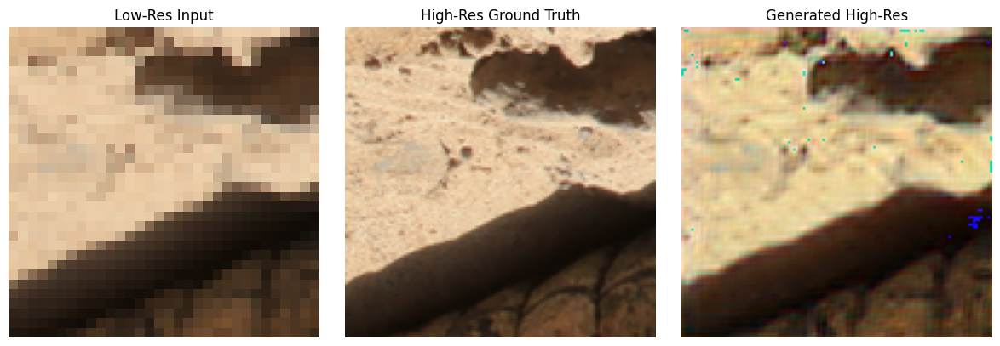

  1%|          | 1/100 [00:00<00:47,  2.09it/s]

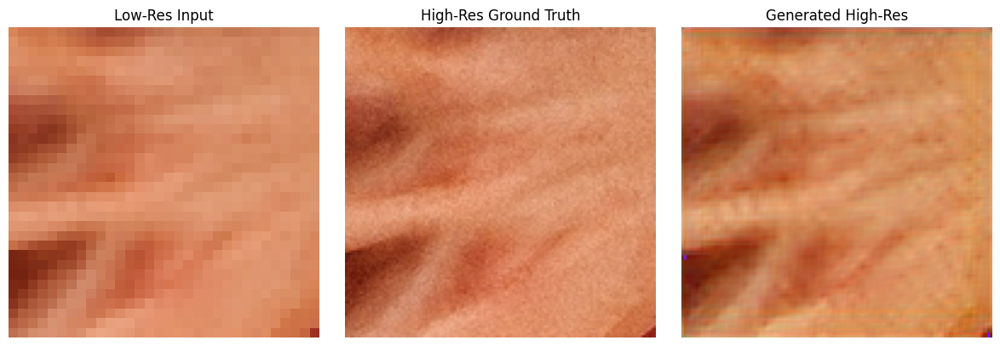

  2%|▏         | 2/100 [00:00<00:41,  2.34it/s]

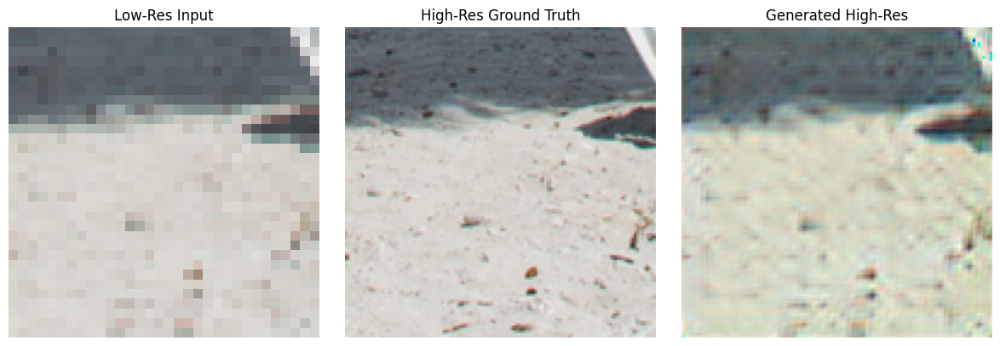

  3%|▎         | 3/100 [00:01<00:41,  2.36it/s]

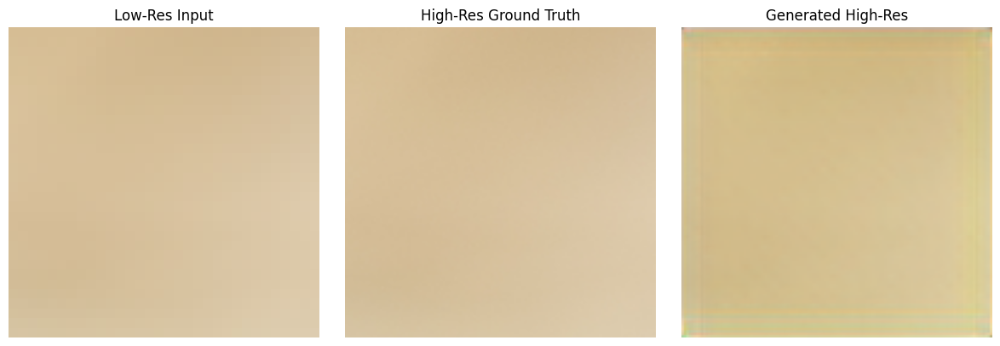

  4%|▍         | 4/100 [00:01<00:34,  2.76it/s]

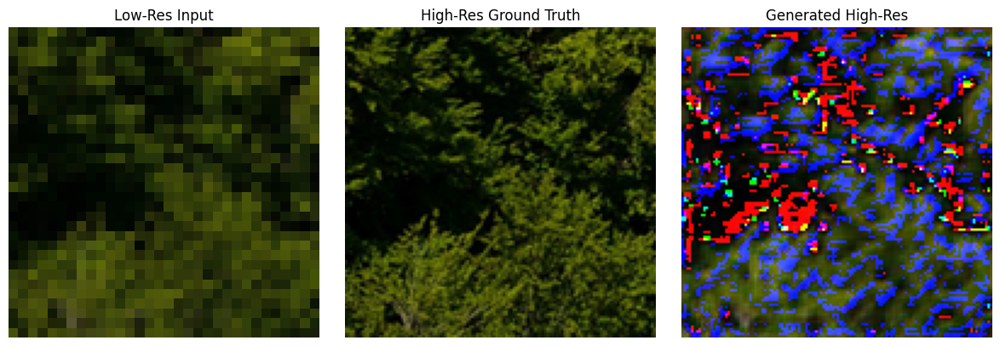

  5%|▌         | 5/100 [00:01<00:35,  2.67it/s]

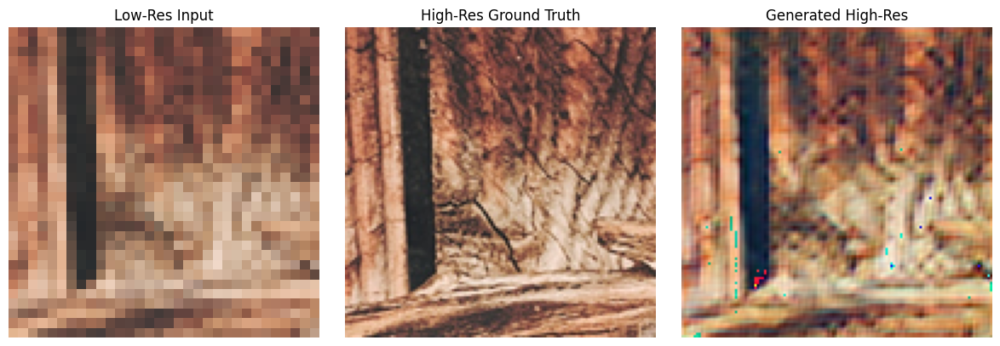

  6%|▌         | 6/100 [00:02<00:36,  2.58it/s]

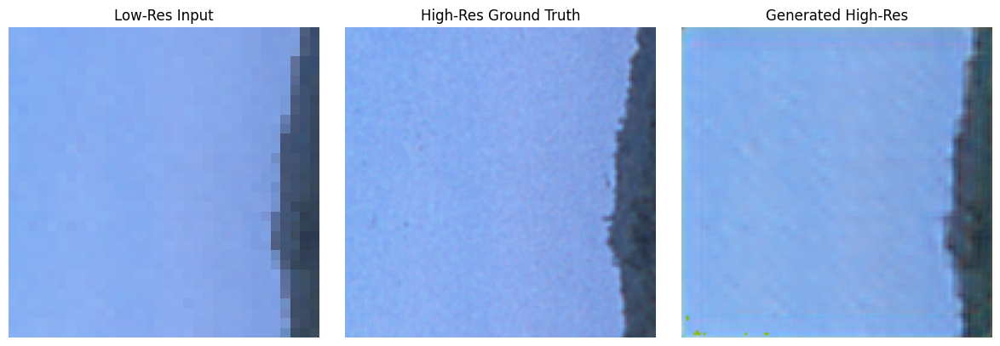

  7%|▋         | 7/100 [00:02<00:36,  2.57it/s]

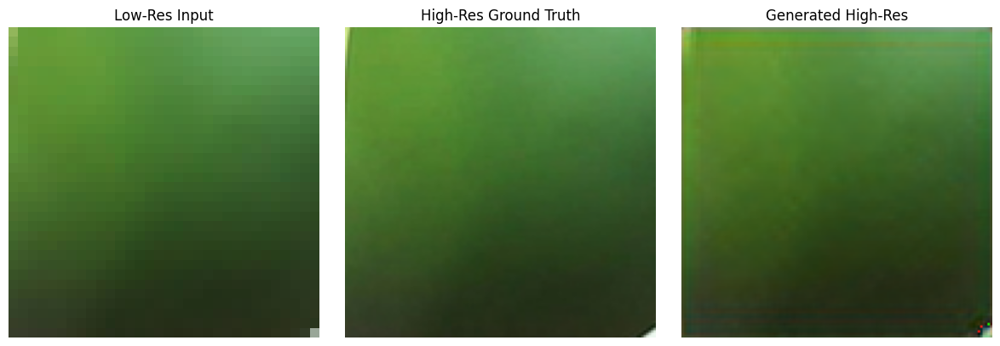

  8%|▊         | 8/100 [00:03<00:33,  2.77it/s]

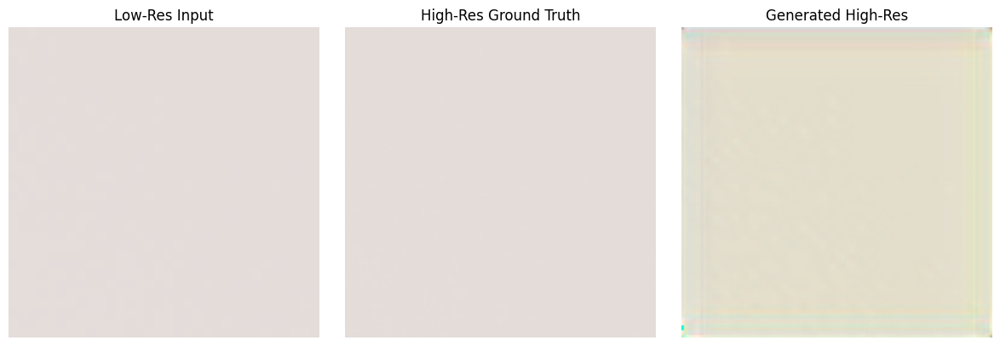

  9%|▉         | 9/100 [00:03<00:29,  3.08it/s]

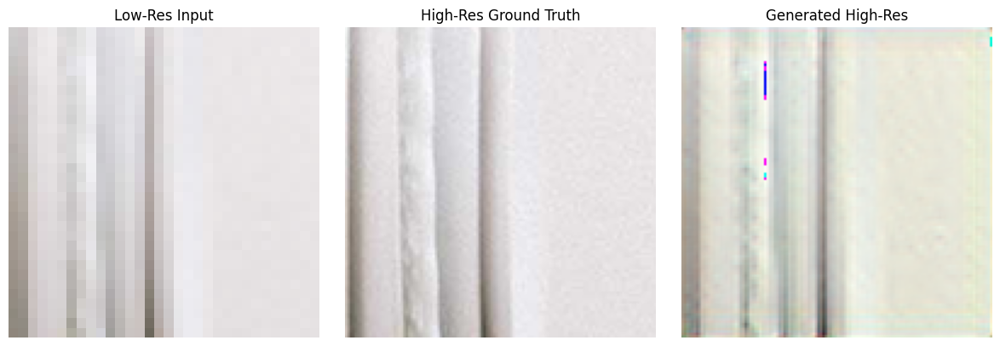

 10%|█         | 10/100 [00:03<00:31,  2.86it/s]

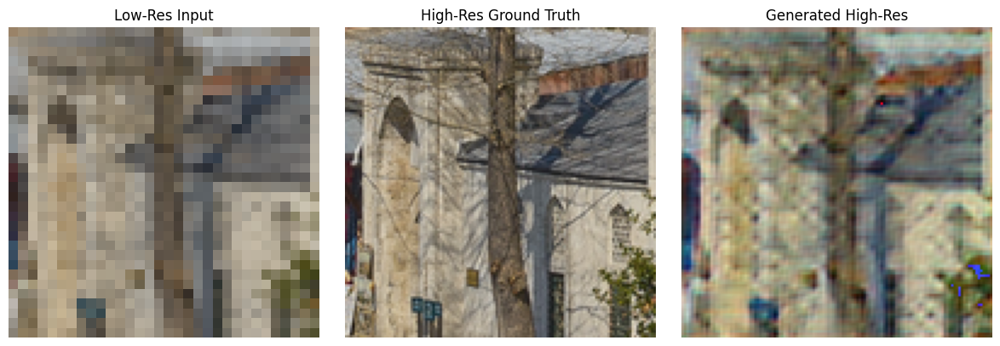

 11%|█         | 11/100 [00:04<00:32,  2.78it/s]

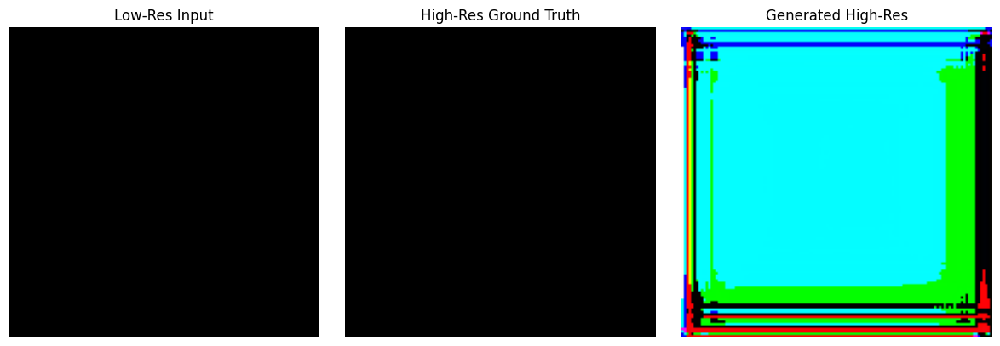

 12%|█▏        | 12/100 [00:04<00:28,  3.04it/s]

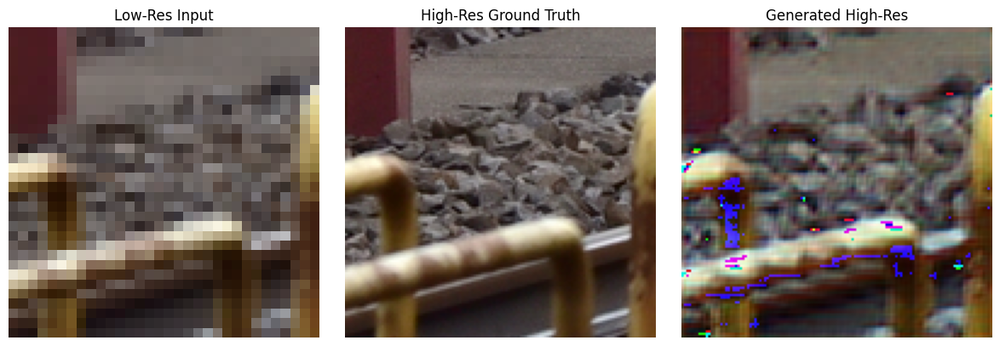

 13%|█▎        | 13/100 [00:04<00:30,  2.89it/s]

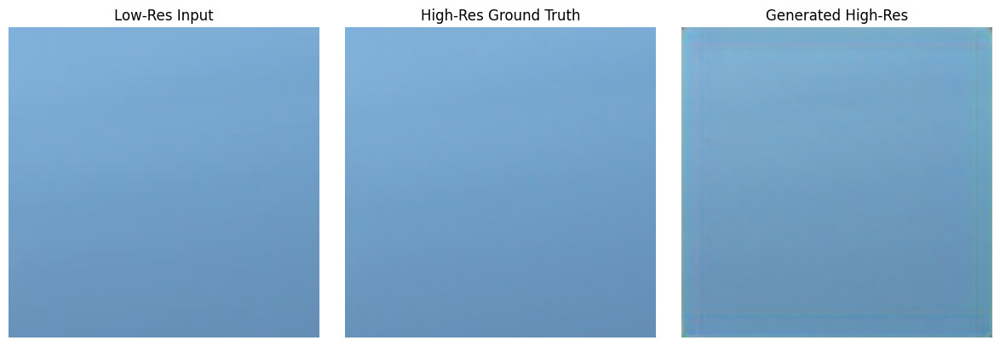

 14%|█▍        | 14/100 [00:05<00:32,  2.62it/s]

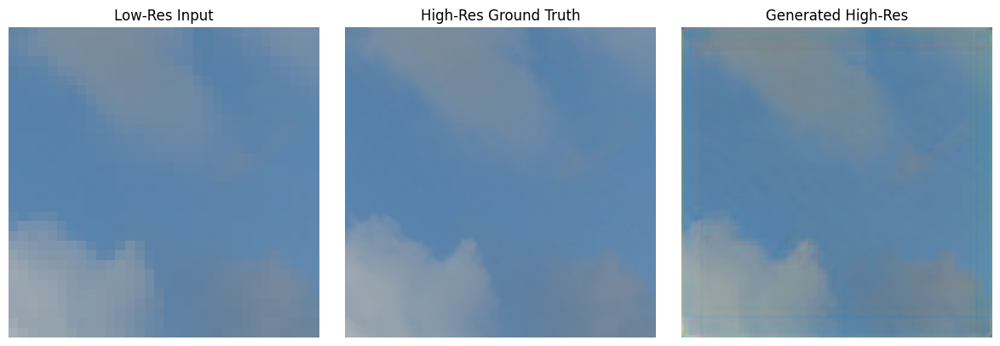

 15%|█▌        | 15/100 [00:05<00:29,  2.84it/s]

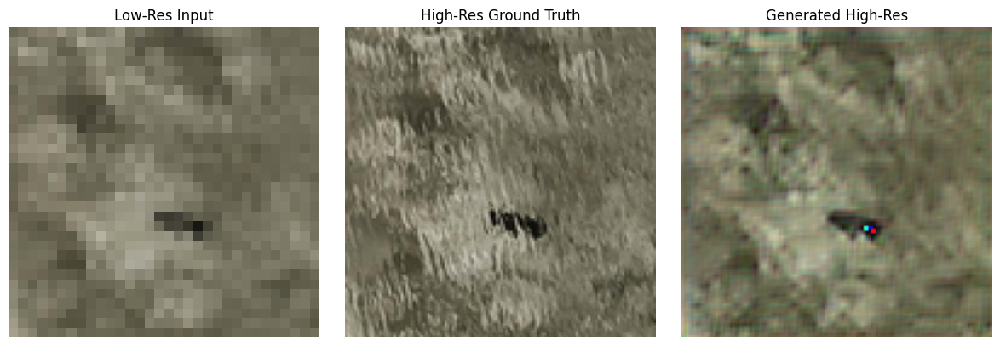

 16%|█▌        | 16/100 [00:05<00:30,  2.73it/s]

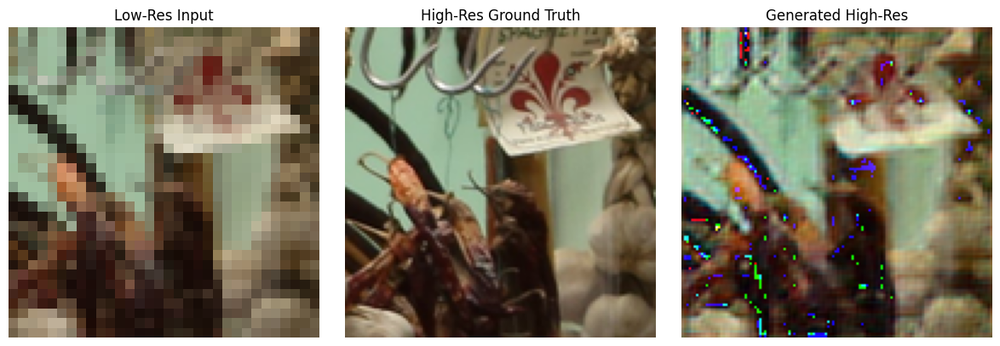

 17%|█▋        | 17/100 [00:06<00:30,  2.68it/s]

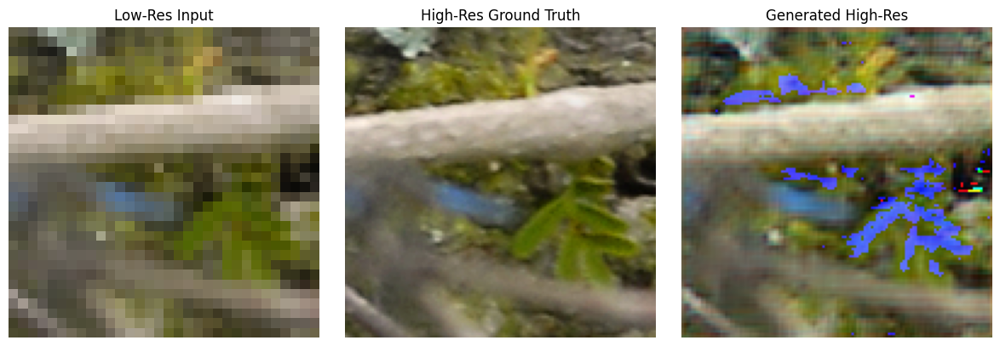

 18%|█▊        | 18/100 [00:06<00:32,  2.53it/s]

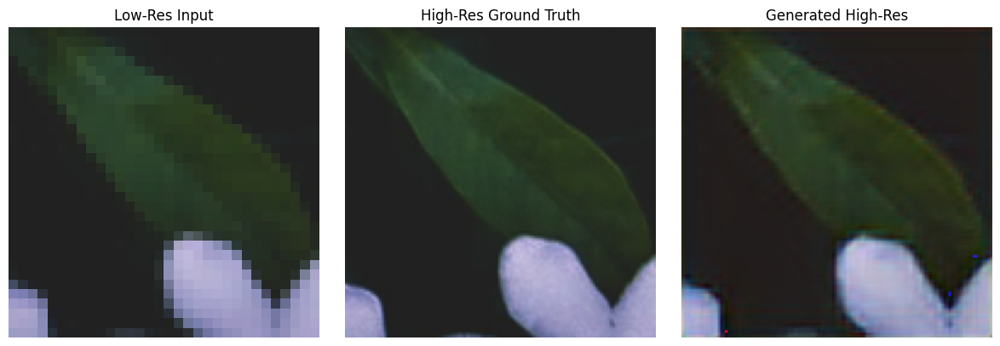

 19%|█▉        | 19/100 [00:07<00:30,  2.67it/s]

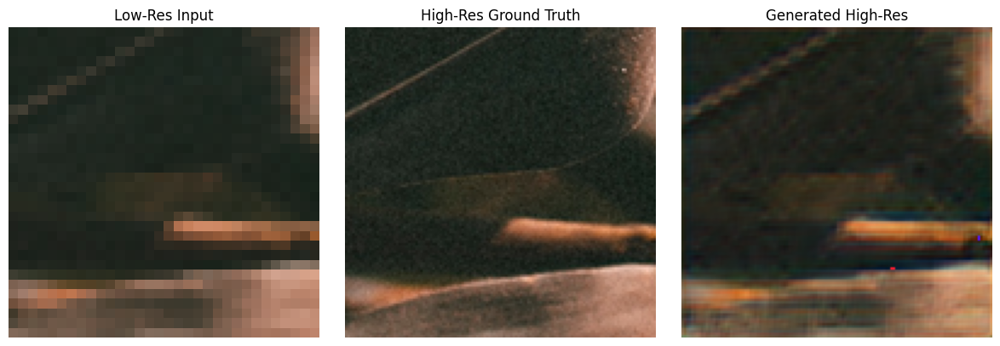

 20%|██        | 20/100 [00:07<00:29,  2.68it/s]

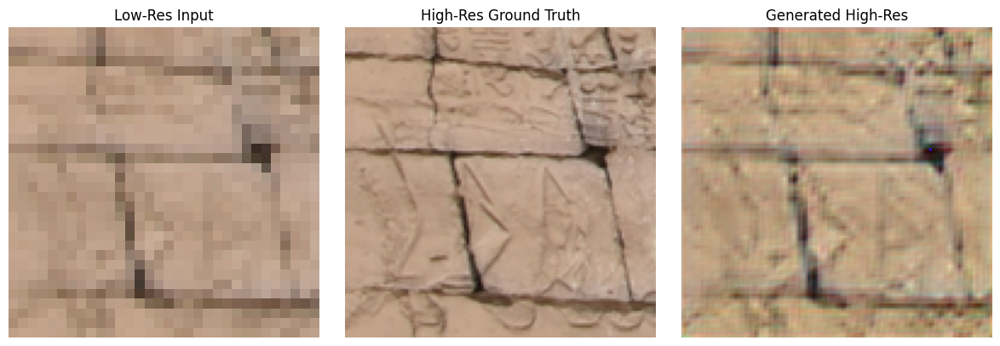

 21%|██        | 21/100 [00:07<00:29,  2.66it/s]


In [22]:
# Display some generated images
topil = transforms.ToPILImage()
for iteration, (low_res, high_res) in enumerate(tqdm(valDataLoader)):
    if iteration > 20:
        break
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Convert tensors in [C, H, W] format
    low_res_img = topil(low_res[0].cpu())
    high_res_img = topil(high_res[0].cpu())

    # Get the output and select only first 3 channels if it has > 3
    fake_high_res = netG(low_res.to(device)).detach().cpu()[0]
    if fake_high_res.shape[0] > 3:
        fake_high_res = fake_high_res[:3]  # keep only RGB channels

    fake_high_res_img = topil(fake_high_res)

    axes[0].imshow(low_res_img)
    axes[0].set_title("Low-Res Input")
    axes[0].axis('off')

    axes[1].imshow(high_res_img)
    axes[1].set_title("High-Res Ground Truth")
    axes[1].axis('off')

    axes[2].imshow(fake_high_res_img)
    axes[2].set_title("Generated High-Res")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()


In [23]:

# # Display some generated images
# topil = transforms.ToPILImage()
# for iteration, (low_res, high_res) in enumerate(tqdm(valDataLoader)):
#     if iteration > 20:
#         break
#     fig, axes = plt.subplots(1, 3)
#     low_res_img = topil(low_res[0].permute(1, 2, 0).cpu())
#     high_res_img = topil(high_res[0].permute(1, 2, 0).cpu())
#     fake_high_res = netG(low_res.to(device)).to('cpu').detach().permute(0, 2, 3, 1)[0]
#     fake_high_res_img = topil(fake_high_res)
    
#     axes[0].imshow(low_res_img)
#     axes[0].set_title("Low-Res Input")
#     axes[0].axis('off')
    
#     axes[1].imshow(high_res_img)
#     axes[1].set_title("High-Res Ground Truth")
#     axes[1].axis('off')
    
#     axes[2].imshow(fake_high_res_img)
#     axes[2].set_title("Generated High-Res")
#     axes[2].axis('off')

# plt.show()

In [24]:

# Training
loss_history2 = train(
    loader=trainDataLoader,
    disc=netD,
    gen=netG,
    opt_gen=optimizerNetG,
    opt_disc=optimizerNetD,
    l1_loss_fn=nn.L1Loss(),
    vgg_loss_fn=VGGLoss(device),
    g_scaler=generator_scaler,
    d_scaler=discriminator_scaler,
    device=device
)


c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ArnavBhatia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
  0%|          | 0/13 [00:00<?, ?it/s]C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_57164\3414633768.py:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
C:\Users\ArnavBhatia\AppData\Local\T

In [25]:

# Save the generator model
torch.save(netG.state_dict(), "super_res_gen600.pth")
torch.save(model['generator'].state_dict(), "super_res_gen_600.pth")
torch.save(model['generator'], "super_res_gen_full600.pth")


In [26]:

def calculate_psnr(generator, test_loader, device='cuda'):
    generator.eval()
    psnr_list = []
    with torch.no_grad():
        for low_res_images, high_res_images in tqdm(test_loader):
            low_res_images = low_res_images.to(device)
            high_res_images = high_res_images.to(device)
            generated_images = generator(low_res_images)
            generated_images = torch.clamp(generated_images, 0.0, 1.0)
            high_res_images = torch.clamp(high_res_images, 0.0, 1.0)
            mse = F.mse_loss(generated_images, high_res_images, reduction='mean')
            psnr = 10 * torch.log10(1.0 / mse)
            psnr_list.append(psnr.item())
    avg_psnr = np.mean(psnr_list)
    print(f"Average PSNR: {avg_psnr} dB")
    return avg_psnr


In [27]:

# Calculate PSNR on validation set
calculate_psnr(netG, valDataLoader)

100%|██████████| 100/100 [00:09<00:00, 10.13it/s]

Average PSNR: 27.263917484283446 dB


27.263917484283446

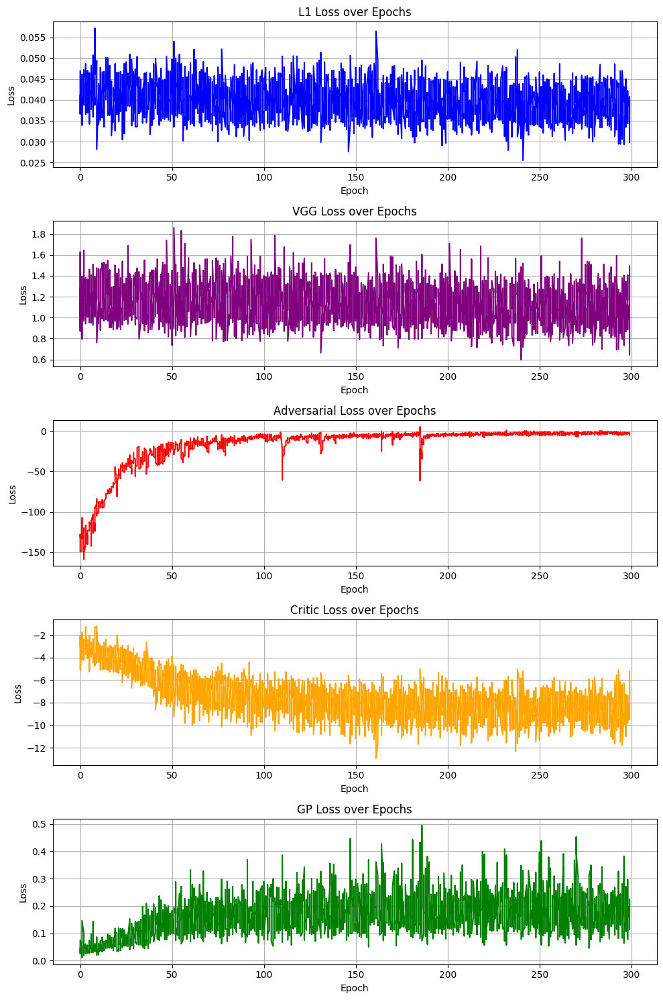

In [28]:


# Plotting the loss history
epochs = [loss['epoch'] for loss in loss_history2]
gp_losses = [loss['gp'] for loss in loss_history2]
critic_losses = [loss['critic'] for loss in loss_history2]
l1_losses = [loss['l1'] for loss in loss_history2]
adversarial_losses = [loss['adversarial'] for loss in loss_history2]
vgg_losses = [loss['vgg'] for loss in loss_history2]

fig, axs = plt.subplots(5, 1, figsize=(10, 15))
axs[0].plot(epochs, l1_losses, label='L1 Loss', color='blue')
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss")
axs[0].set_title("L1 Loss over Epochs")
axs[0].grid(True)

axs[1].plot(epochs, vgg_losses, label='VGG Loss', color='purple')
axs[1].set_xlabel("Epoch")
axs[1].set_ylabel("Loss")
axs[1].set_title("VGG Loss over Epochs")
axs[1].grid(True)

axs[2].plot(epochs, adversarial_losses, label='Adversarial Loss', color='red')
axs[2].set_xlabel("Epoch")
axs[2].set_ylabel("Loss")
axs[2].set_title("Adversarial Loss over Epochs")
axs[2].grid(True)

axs[3].plot(epochs, critic_losses, label='Critic Loss', color='orange')
axs[3].set_xlabel("Epoch")
axs[3].set_ylabel("Loss")
axs[3].set_title("Critic Loss over Epochs")
axs[3].grid(True)

axs[4].plot(epochs, gp_losses, label='GP Loss', color='green')
axs[4].set_xlabel("Epoch")
axs[4].set_ylabel("Loss")
axs[4].set_title("GP Loss over Epochs")
axs[4].grid(True)

plt.tight_layout()
plt.show()


  0%|          | 0/100 [00:00<?, ?it/s]

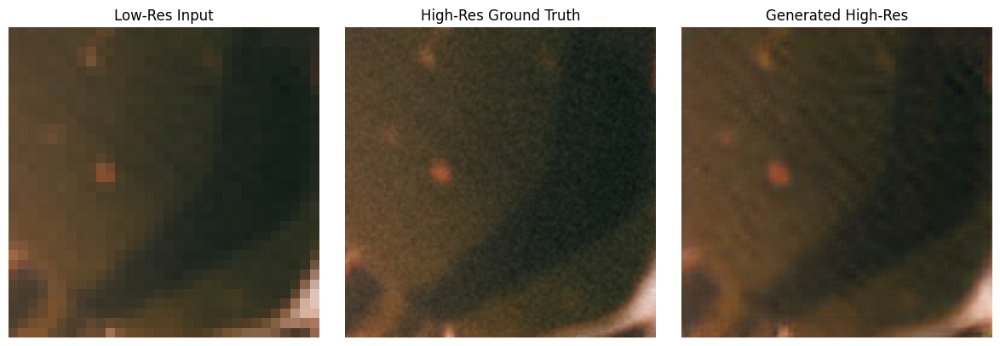

  1%|          | 1/100 [00:00<00:38,  2.55it/s]

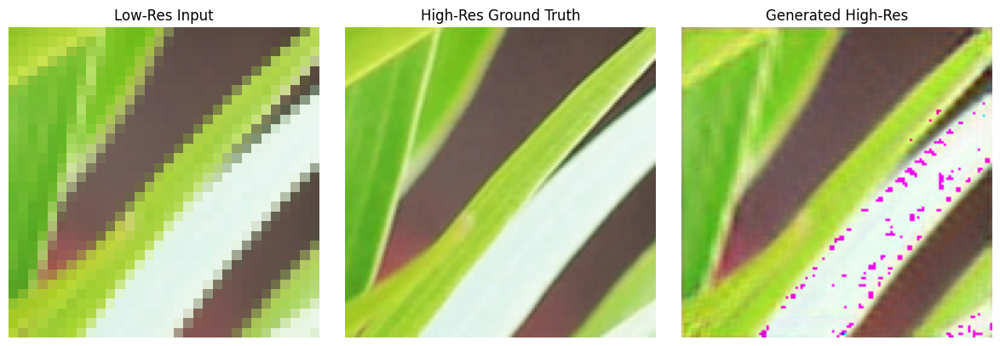

  2%|▏         | 2/100 [00:00<00:38,  2.55it/s]

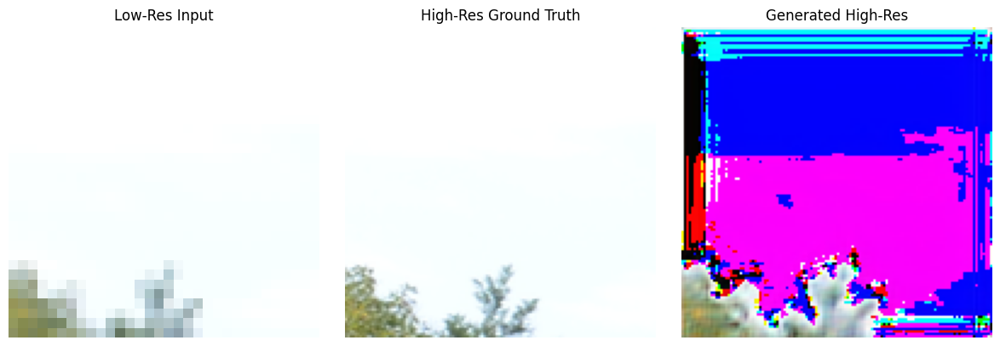

  3%|▎         | 3/100 [00:01<00:31,  3.05it/s]

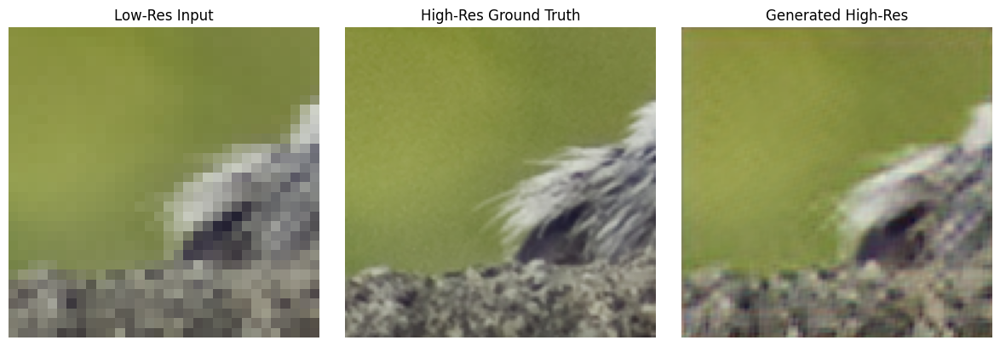

  4%|▍         | 4/100 [00:01<00:33,  2.89it/s]

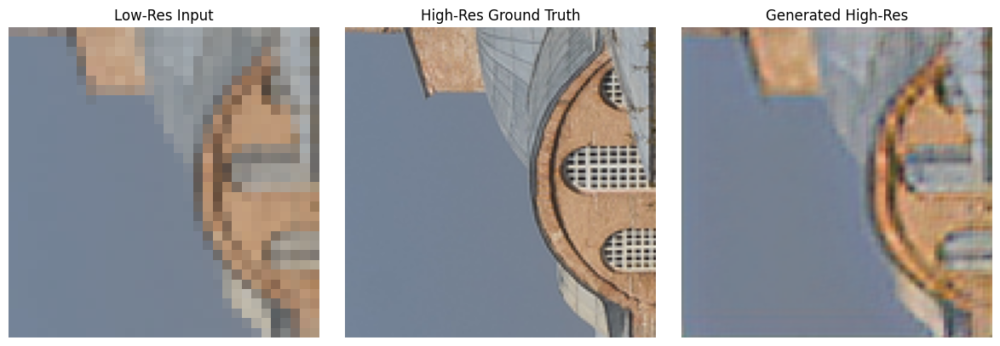

  5%|▌         | 5/100 [00:01<00:34,  2.74it/s]

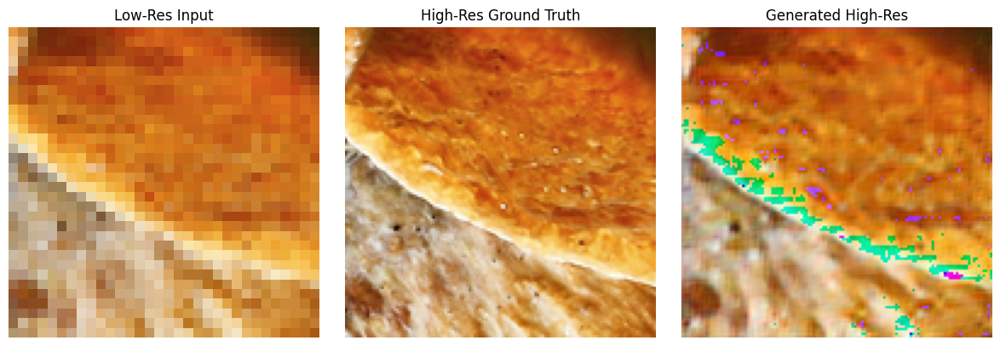

  6%|▌         | 6/100 [00:02<00:36,  2.60it/s]

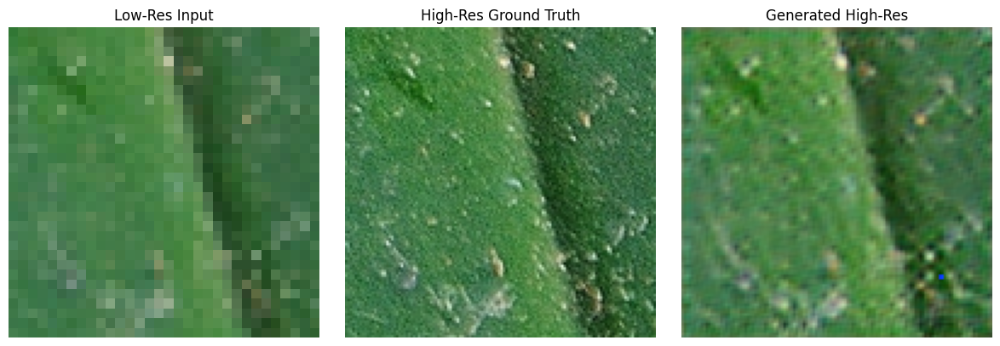

  7%|▋         | 7/100 [00:03<00:49,  1.89it/s]

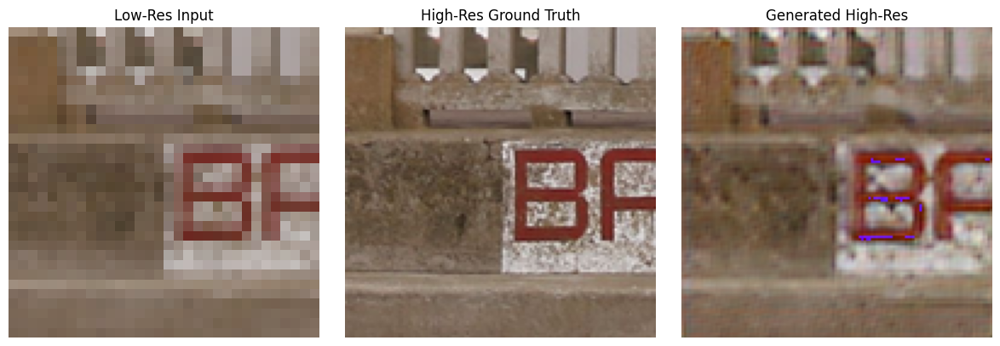

  8%|▊         | 8/100 [00:03<00:44,  2.07it/s]

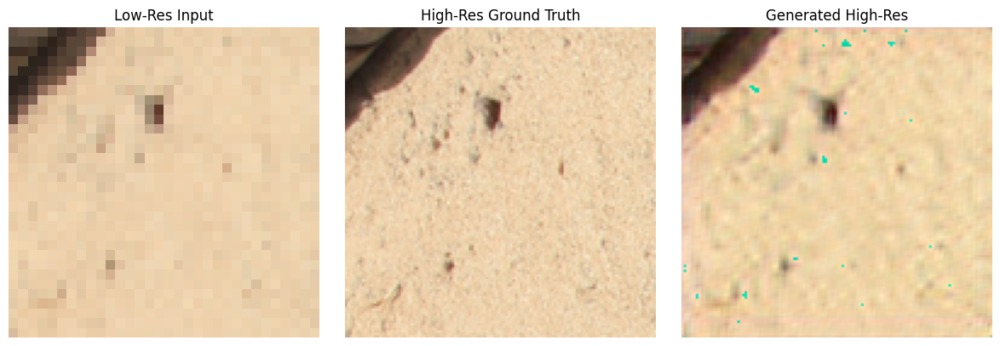

  9%|▉         | 9/100 [00:03<00:41,  2.18it/s]

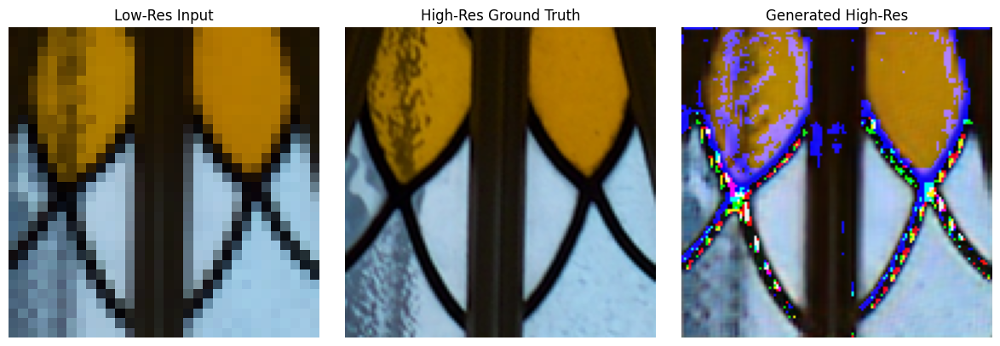

 10%|█         | 10/100 [00:04<00:38,  2.32it/s]

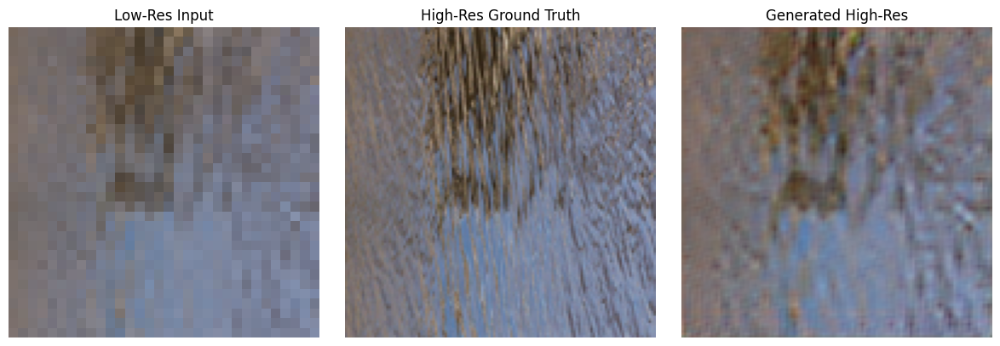

 11%|█         | 11/100 [00:04<00:37,  2.35it/s]

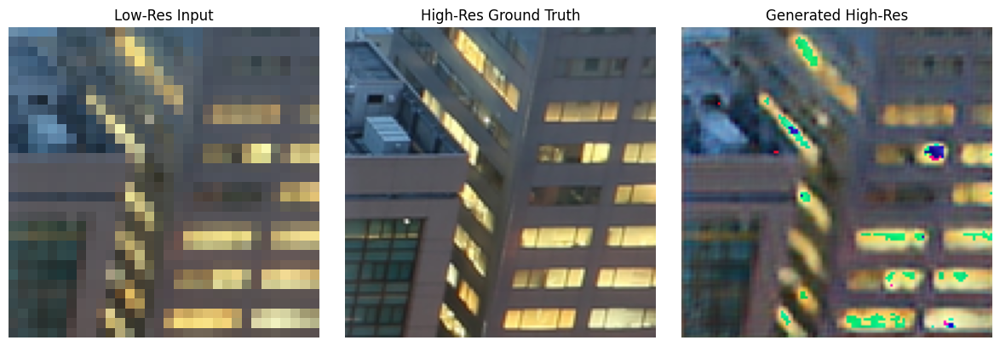

 12%|█▏        | 12/100 [00:05<00:36,  2.40it/s]

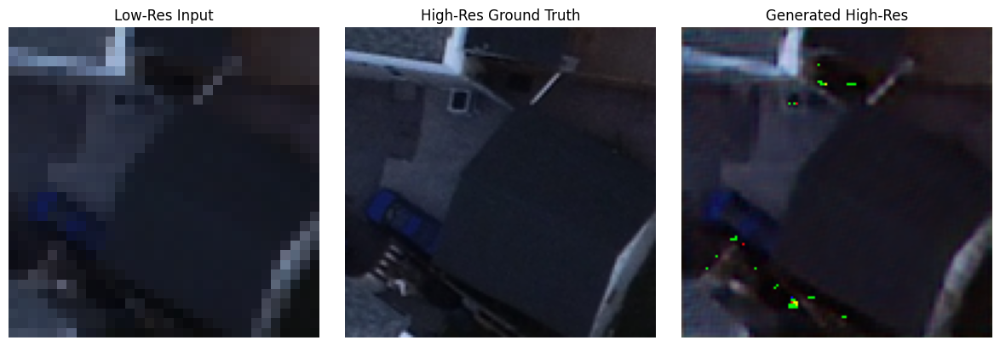

 13%|█▎        | 13/100 [00:05<00:36,  2.38it/s]

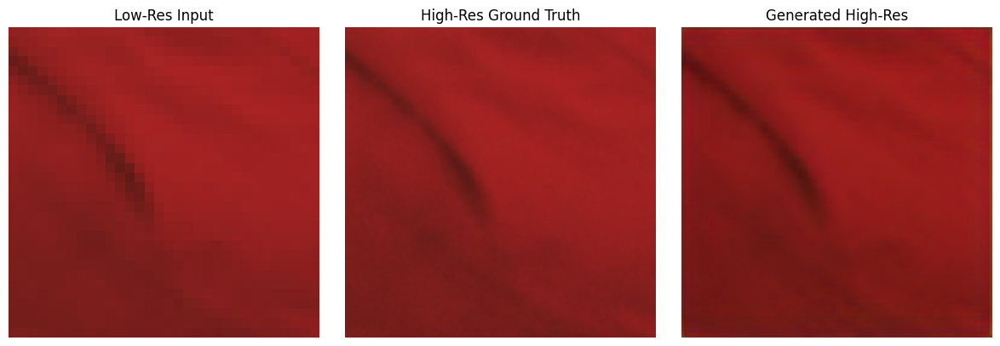

 14%|█▍        | 14/100 [00:05<00:32,  2.63it/s]

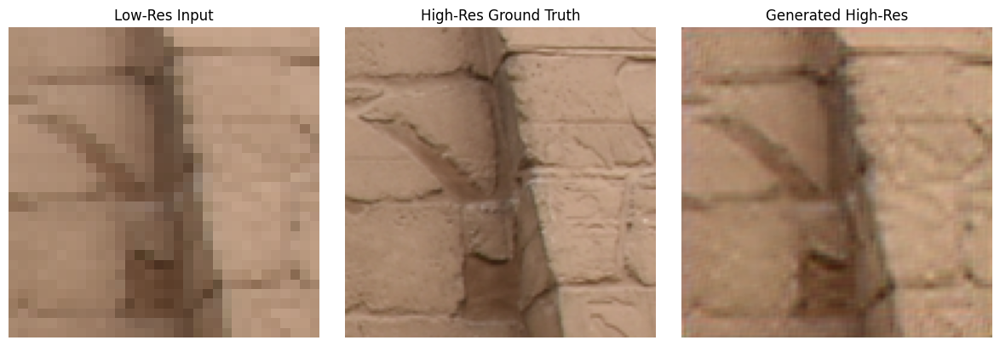

 15%|█▌        | 15/100 [00:06<00:32,  2.60it/s]

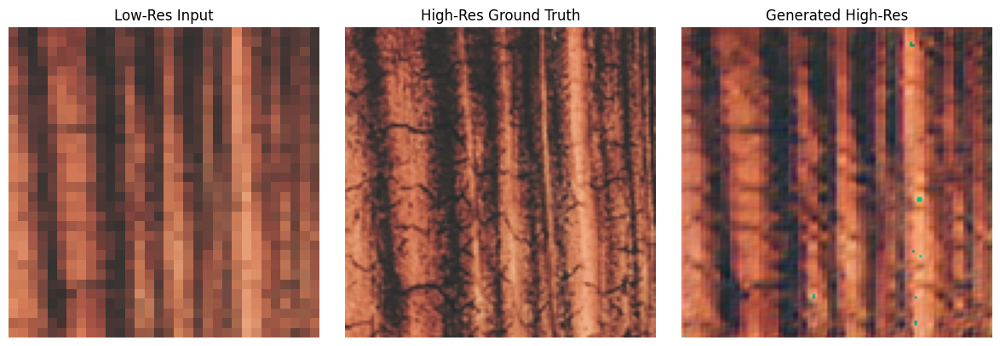

 16%|█▌        | 16/100 [00:06<00:32,  2.56it/s]

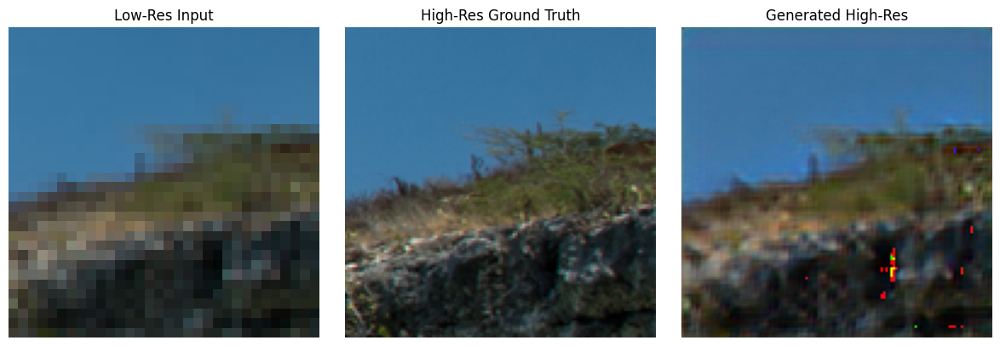

 17%|█▋        | 17/100 [00:06<00:32,  2.56it/s]

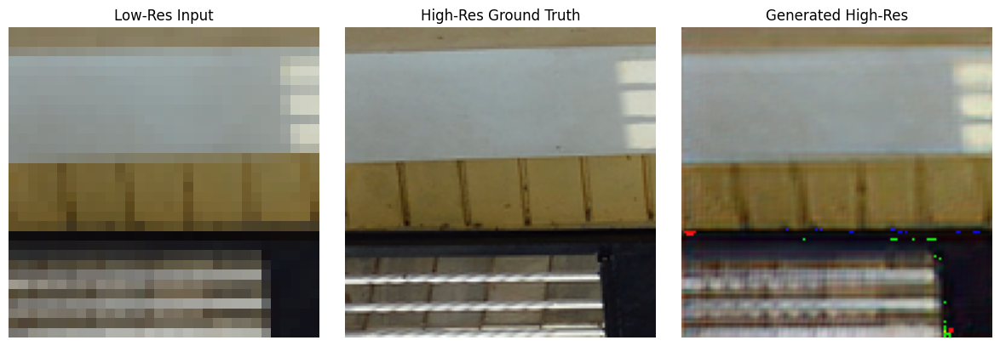

 18%|█▊        | 18/100 [00:07<00:31,  2.58it/s]

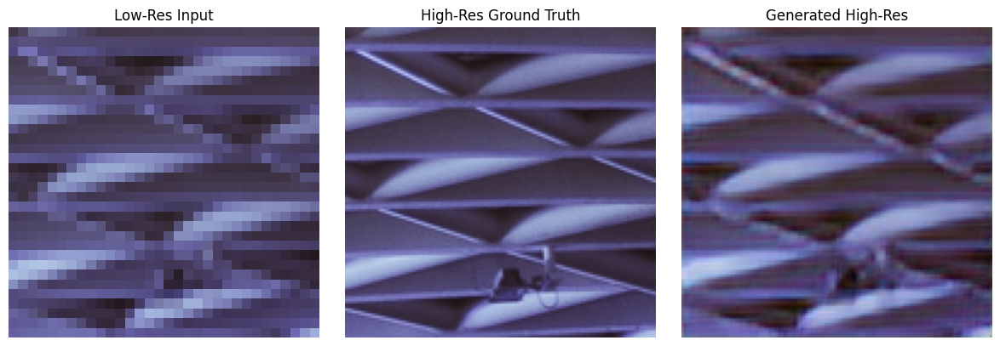

 19%|█▉        | 19/100 [00:07<00:31,  2.59it/s]

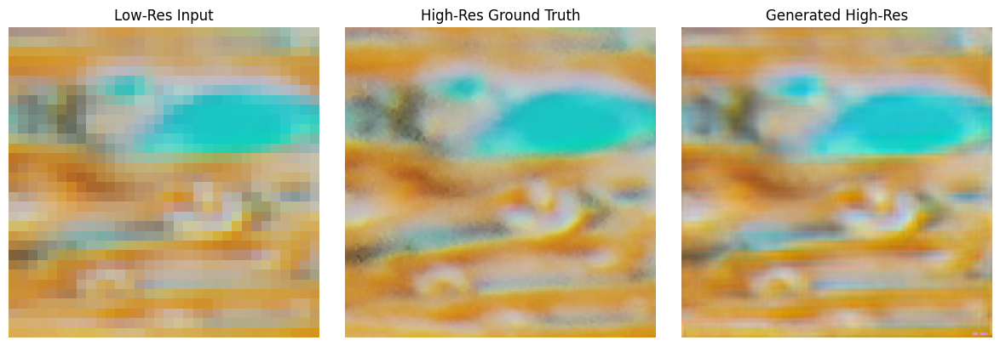

 20%|██        | 20/100 [00:08<00:32,  2.46it/s]

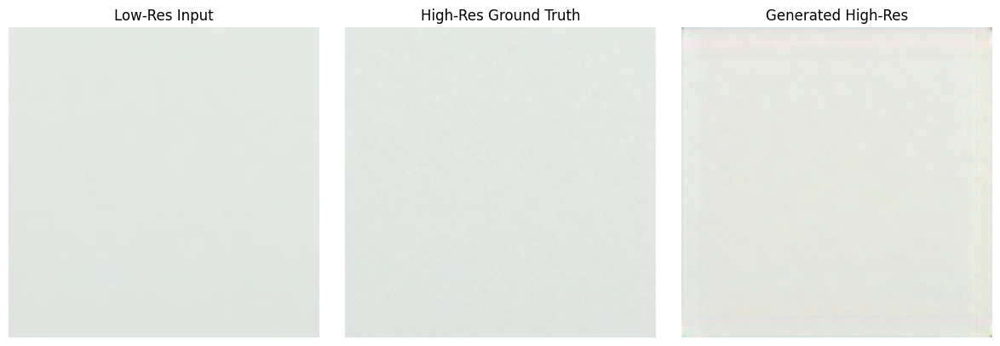

 21%|██        | 21/100 [00:08<00:32,  2.45it/s]


In [30]:
# Display some generated images
topil = transforms.ToPILImage()
for iteration, (low_res, high_res) in enumerate(tqdm(valDataLoader)):
    if iteration > 20:
        break
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Convert tensors in [C, H, W] format
    low_res_img = topil(low_res[0].cpu())
    high_res_img = topil(high_res[0].cpu())

    # Get the output and select only first 3 channels if it has > 3
    fake_high_res = netG(low_res.to(device)).detach().cpu()[0]
    if fake_high_res.shape[0] > 3:
        fake_high_res = fake_high_res[:3]  # keep only RGB channels

    fake_high_res_img = topil(fake_high_res)

    axes[0].imshow(low_res_img)
    axes[0].set_title("Low-Res Input")
    axes[0].axis('off')

    axes[1].imshow(high_res_img)
    axes[1].set_title("High-Res Ground Truth")
    axes[1].axis('off')

    axes[2].imshow(fake_high_res_img)
    axes[2].set_title("Generated High-Res")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()


In [31]:

# # Display some generated images
# topil = transforms.ToPILImage()
# for iteration, (low_res, high_res) in enumerate(tqdm(valDataLoader)):
#     if iteration > 20:
#         break
#     fig, axes = plt.subplots(1, 3)
#     low_res_img = topil(low_res[0].permute(1, 2, 0).cpu())
#     high_res_img = topil(high_res[0].permute(1, 2, 0).cpu())
#     fake_high_res = netG(low_res.to(device)).to('cpu').detach().permute(0, 2, 3, 1)[0]
#     fake_high_res_img = topil(fake_high_res)
    
#     axes[0].imshow(low_res_img)
#     axes[0].set_title("Low-Res Input")
#     axes[0].axis('off')
    
#     axes[1].imshow(high_res_img)
#     axes[1].set_title("High-Res Ground Truth")
#     axes[1].axis('off')
    
#     axes[2].imshow(fake_high_res_img)
#     axes[2].set_title("Generated High-Res")
#     axes[2].axis('off')

# plt.show()